<a href="https://colab.research.google.com/github/tsrtsr/datasciencecoursera/blob/master/week6_final_project_image_captioning_clean%20(CNN-RNN).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/encoder_decoder.png?raw=1" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

In [ ]:
# https://github.com/hse-aml/intro-to-dl/blob/master/README.md
# https://github.com/hse-aml/intro-to-dl/blob/master/setup_google_colab.py
# https://github.com/hse-aml/intro-to-dl/tree/master/week6

In [ ]:
! shred -u setup_google_colab.py
! wget https://raw.githubusercontent.com/hse-aml/intro-to-dl/master/setup_google_colab.py -O setup_google_colab.py
import setup_google_colab
# please, uncomment the week you're working on
# setup_google_colab.setup_week1()
# setup_google_colab.setup_week2()
# setup_google_colab.setup_week3()
# setup_google_colab.setup_week4()
# setup_google_colab.setup_week5()
setup_google_colab.setup_week6()

# If you're using the old version of the course (check a path of notebook on Coursera, you'll see v1 or v2),
# use setup_week2_old().

shred: setup_google_colab.py: failed to open for writing: No such file or directory
--2019-07-05 10:29:06--  https://raw.githubusercontent.com/hse-aml/intro-to-dl/master/setup_google_colab.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3792 (3.7K) [text/plain]
Saving to: ‘setup_google_colab.py’

setup_google_colab. 100%[===================>]   3.70K  --.-KB/s    in 0s      

2019-07-05 10:29:06 (84.1 MB/s) - ‘setup_google_colab.py’ saved [3792/3792]

**************************************************
captions_train-val2014.zip
**************************************************
train2014_sample.zip
**************************************************
train_img_embeds.pickle
**************************************************
train_img_fns.pickle
*****************

# Import stuff

In [ ]:
import sys
sys.path.append("..")
import grading
import download_utils

In [ ]:
download_utils.link_all_keras_resources()

In [ ]:
import tensorflow as tf
from tensorflow.contrib import keras
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
L = keras.layers
K = keras.backend
import utils
import time
import zipfile
import json
from collections import defaultdict
import re # Regular Expression
import random
from random import choice
import grading_utils
import os
from keras_utils import reset_tf_session
import tqdm_utils # progress bar. Te Quiero Demasiado

Using TensorFlow backend.


# Prepare the storage for model checkpoints

In [ ]:
# Leave USE_GOOGLE_DRIVE = False if you're running locally!
# We recommend to set USE_GOOGLE_DRIVE = True in Google Colab!
# If set to True, we will mount Google Drive, so that you can restore your checkpoint 
# and continue trainig even if your previous Colab session dies.
# If set to True, follow on-screen instructions to access Google Drive (you must have a Google account).
USE_GOOGLE_DRIVE = True # Mudei

def mount_google_drive():
    from google.colab import drive
    mount_directory = "/content/gdrive" # Monta o MyDrive do meu gmail drive.
    drive.mount(mount_directory)
    drive_root = mount_directory + "/" + list(filter(lambda x: x[0] != '.', os.listdir(mount_directory)))[0] + "/colab" # Devolve a primera pasta 'My Drive' sem contar com '.' ou '..'
    return drive_root

CHECKPOINT_ROOT = ""
if USE_GOOGLE_DRIVE:
    CHECKPOINT_ROOT = mount_google_drive() + "/"

def get_checkpoint_path(epoch=None):
    if epoch is None:
        return os.path.abspath(CHECKPOINT_ROOT + "weights")
    else:
        return os.path.abspath(CHECKPOINT_ROOT + "weights_{}".format(epoch))
      
# example of checkpoint dir
print(get_checkpoint_path(10)) # ainda não existe está só a gerar nomes de ficheiros

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive
/content/gdrive/My Drive/colab/weights_10


In [ ]:
# https://colab.research.google.com/notebooks/io.ipynb#scrollTo=XDg9OBaYqRMd
mount_directory = "/content/gdrive"
print(mount_directory)
print(os.listdir(mount_directory))
print(list(filter(lambda x: x[0] != '.', os.listdir(mount_directory))))
print(list(filter(lambda x: x[0] != '.', os.listdir(mount_directory)))[0] + "/colab")
print(os.path.abspath(CHECKPOINT_ROOT + "weights"))

/content/gdrive
['My Drive', '.Trash']
['My Drive']
My Drive/colab
/content/gdrive/My Drive/colab/weights


In [ ]:
with open('/content/gdrive/My Drive/foo_.txt', 'w') as f:
  f.write('Hello Google Drive!')
!cat /content/gdrive/My\ Drive/foo.txt
print(os.getcwd())

Hello Google Drive!/content


# Fill in your Coursera token and email
To successfully submit your answers to our grader, please fill in your Coursera submission token and email

In [ ]:
grader = grading.Grader(assignment_key="NEDBg6CgEee8nQ6uE8a7OA", 
                        all_parts=["19Wpv", "uJh73", "yiJkt", "rbpnH", "E2OIL", "YJR7z"])

In [ ]:
# token expires every 30 min
COURSERA_TOKEN = "### YOUR TOKEN HERE"
COURSERA_EMAIL = "telmo.rodrigues@netcabo.pt"

# Download data

Takes 10 hours and 20 GB. We've downloaded necessary files for you.

Relevant links (just in case):
- train images http://msvocds.blob.core.windows.net/coco2014/train2014.zip
- validation images http://msvocds.blob.core.windows.net/coco2014/val2014.zip
- captions for both train and validation http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip

In [ ]:
# we downloaded them for you, just link them here
download_utils.link_week_6_resources()

# Extract image features

We will use pre-trained InceptionV3 model for CNN encoder (https://research.googleblog.com/2016/03/train-your-own-image-classifier-with.html) and extract its last hidden layer as an embedding:

<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/inceptionv3.png?raw=1" style="width:70%">

In [ ]:
IMG_SIZE = 299

In [ ]:
# we take the last hidden layer of IncetionV3 as an image embedding # image embedding é como um tradutor de imagem: cada imagem corresponde a um token.
def get_cnn_encoder():
    K.set_learning_phase(False) # K são as keras.backend
    model = keras.applications.InceptionV3(include_top=False)
    preprocess_for_model = keras.applications.inception_v3.preprocess_input

    model = keras.models.Model(model.inputs, keras.layers.GlobalAveragePooling2D()(model.output))
    return model, preprocess_for_model

Features extraction takes too much time on CPU:
- Takes 16 minutes on GPU.
- 25x slower (InceptionV3) on CPU and takes 7 hours.
- 10x slower (MobileNet) on CPU and takes 3 hours.

So we've done it for you with the following code:
```python
# load pre-trained model
reset_tf_session()
encoder, preprocess_for_model = get_cnn_encoder()

# extract train features
train_img_embeds, train_img_fns = utils.apply_model(
    "train2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(train_img_embeds, "train_img_embeds.pickle")
utils.save_pickle(train_img_fns, "train_img_fns.pickle")

# extract validation features
val_img_embeds, val_img_fns = utils.apply_model(
    "val2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(val_img_embeds, "val_img_embeds.pickle")
utils.save_pickle(val_img_fns, "val_img_fns.pickle")

# sample images for learners
def sample_zip(fn_in, fn_out, rate=0.01, seed=42):
    np.random.seed(seed)
    with zipfile.ZipFile(fn_in) as fin, zipfile.ZipFile(fn_out, "w") as fout:
        sampled = filter(lambda _: np.random.rand() < rate, fin.filelist)
        for zInfo in sampled:
            fout.writestr(zInfo, fin.read(zInfo))
            
sample_zip("train2014.zip", "train2014_sample.zip")
sample_zip("val2014.zip", "val2014_sample.zip")
```

In [ ]:
# "Pickling” is the process whereby a Python object hierarchy is converted into a byte stream (https://docs.python.org/3/library/pickle.html#data-stream-format)

# load prepared embeddings
train_img_embeds = utils.read_pickle("train_img_embeds.pickle") # resultado do Inception V3
train_img_fns = utils.read_pickle("train_img_fns.pickle") # nome das imagens
val_img_embeds = utils.read_pickle("val_img_embeds.pickle")
val_img_fns = utils.read_pickle("val_img_fns.pickle")
# check shapes
print(train_img_embeds.shape, len(train_img_fns)) # 82783 input images cada com 2048 valores de nós
print(val_img_embeds.shape, len(val_img_fns)) # 40504 input images cada com 2048 valores de nós

(82783, 2048) 82783
(40504, 2048) 40504


In [ ]:
print(os.path.abspath("."))
print(type(train_img_embeds))
print(type(train_img_fns)) # fn - file name
print(type(val_img_embeds))
print(type(val_img_fns))
print(len(val_img_fns))
print(train_img_fns[0:5]) # train file names
print(val_img_fns[0:5]) # validation file names

/content
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
40504
['COCO_train2014_000000270070.jpg', 'COCO_train2014_000000101772.jpg', 'COCO_train2014_000000359320.jpg', 'COCO_train2014_000000486482.jpg', 'COCO_train2014_000000116155.jpg']
['COCO_val2014_000000324670.jpg', 'COCO_val2014_000000464263.jpg', 'COCO_val2014_000000526418.jpg', 'COCO_val2014_000000230593.jpg', 'COCO_val2014_000000186147.jpg']


In [ ]:
# check prepared samples of images
list(filter(lambda x: x.endswith("_sample.zip"), os.listdir(".")))
print(os.listdir("."))
print(os.getcwd())

encoder, preprocess_for_model = get_cnn_encoder()
# encoder.summary() # Layers description
# Layer (type)                    Output Shape         Param #     Connected to     
# global_average_pooling2d_2 (Glo (None, 2048)         0           mixed10[0][0] (últoma linha)

W0705 10:32:06.911666 139840295016320 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


['.config', 'val_img_embeds.pickle', 'utils.py', 'captions_train-val2014.zip', '__pycache__', 'train2014_sample.zip', 'tqdm_utils.py', 'download_utils.py', 'grading_utils.py', 'train_img_fns.pickle', 'setup_google_colab.py', 'grading.py', 'val2014_sample.zip', 'gdrive', 'val_img_fns.pickle', 'keras_utils.py', 'train_img_embeds.pickle', 'sample_data']
/content


# Extract captions for images

In [ ]:
# extract captions from zip
def get_captions_for_fns(fns, zip_fn, zip_json_path):
    zf = zipfile.ZipFile(zip_fn)
    j = json.loads(zf.read(zip_json_path).decode("utf8"))
    id_to_fn = {img["id"]: img["file_name"] for img in j["images"]}
    fn_to_caps = defaultdict(list)
    for cap in j['annotations']:
        fn_to_caps[id_to_fn[cap['image_id']]].append(cap['caption'])
    fn_to_caps = dict(fn_to_caps)
    return list(map(lambda x: fn_to_caps[x], fns))
    
train_captions = get_captions_for_fns(train_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_train2014.json")

val_captions = get_captions_for_fns(val_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_val2014.json")

# check shape
print(len(train_img_fns), len(train_captions))
print(len(val_img_fns), len(val_captions))

82783 82783
40504 40504


In [ ]:
print(train_captions[0:1]) # labels, títulos dos ficheiros do train_set. Cada imagem tem um conjuntos de descrições.
print(val_captions[0:1]) # labels, títulos dos ficheiros do validation_set. Cada imagem tem um conjuntos de descrições.

[['A long dirt road going through a forest.', 'A SCENE OF WATER AND A PATH WAY', 'A sandy path surrounded by trees leads to a beach.', 'Ocean view through a dirt road surrounded by a forested area. ', 'dirt path leading beneath barren trees to open plains']]
[['A seagull sitting on the pier with the light house behind him.', 'A bird is sitting on the rail next to the lake and a light house. ', 'White bird sitting in front of a lighthouse with a red roof. ', 'A seagull rests on a concrete wall, with the ocean and a lighthouse in the background.', 'A seagull sitting on a cement ledge across from a lighthouse port.']]


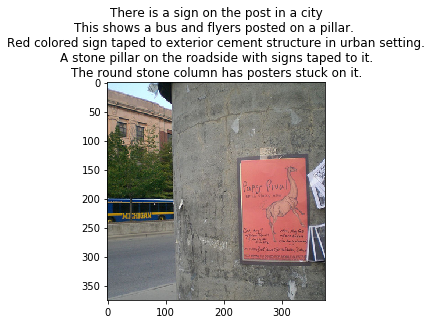

In [ ]:
# look at training example (each has 5 captions)
def show_trainig_example(train_img_fns, train_captions, example_idx=0):
    """
    You can change example_idx and see different images
    """
    zf = zipfile.ZipFile("train2014_sample.zip")
    captions_by_file = dict(zip(train_img_fns, train_captions))
    all_files = set(train_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    img = utils.decode_image_from_buf(zf.read(example))
    plt.imshow(utils.image_center_crop(img))
    plt.title("\n".join(captions_by_file[example.filename.rsplit("/")[-1]]))
    plt.show()
    
show_trainig_example(train_img_fns, train_captions, example_idx=18) # Alterar o 140 para ver outros exemplos. Do sample! não é do train_set.

# Prepare captions for training

In [ ]:
# preview captions data
train_captions[:3] # Ver os útimos dois conjuntos de captions

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another'],
 ['A tabby cat sitting in front of a car.',
  'A brown and black cat sitting on driveway next to a white car.',
  'A sleepy looking cat sitting in front of a white car.',
  'A cat sits in front of a parked car.',
  'A cat sitting in front of a parked white car.  ']]

In [ ]:
# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))

frase = train_captions[777][4]
print("train_captions[777]: ", train_captions[777])
print("train_captions[777][1]: ", train_captions[777][1])
print("type(train_captions): ", type(train_captions))
print(len(train_captions))
print(len(train_captions[1001]))
print(split_sentence(frase))
print(re.split('\W+', frase.lower()))

train_captions[777]:  ['there is a bathroom with white tile floors and a pattern on the walls', 'a bath room with a toilet a bath tub and a mirror', 'A light that is on above a mirror.', 'A typical residential bathroom with shower over the tub', 'A clean bathroom with a strong white theme.']
train_captions[777][1]:  a bath room with a toilet a bath tub and a mirror
type(train_captions):  <class 'list'>
82783
5
['a', 'clean', 'bathroom', 'with', 'a', 'strong', 'white', 'theme']
['a', 'clean', 'bathroom', 'with', 'a', 'strong', 'white', 'theme', '']


In [ ]:
from collections import Counter

# special tokens
PAD = "#PAD#"
UNK = "#UNK#"
START = "#START#"
END = "#END#"

# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))

def generate_vocabulary(train_captions): # São todas as frases (82783, 5)
    """
    Return {token: index} for all train tokens (words) that occur 5 times or more, 
        `index` should be from 0 to N, where N is a number of unique tokens in the resulting dictionary.
    Use `split_sentence` function to split sentence into tokens.
    Also, add PAD (for batch padding), UNK (unknown, out of vocabulary), 
        START (start of sentence) and END (end of sentence) tokens into the vocabulary.
    """
    
    words = [sentence for caption in train_captions for sentence in caption] # https://docs.python.org/2/tutorial/datastructures.html#list-comprehensions
    # words = []
    # for caption in train_captions
    #     for sentence in caption
    #         word.append(sentence)
    words = split_sentence(' '.join(words)) # Junta todas as sentences separadas por <espaço>, e depois aplica split_sentende
    
    # Counter devolve um dicionário com as palavras e sua ocorrência. {'blue': 3, 'red': 2, 'yellow': 1}
    counter = Counter(words) # tally. https://stackoverflow.com/questions/2600191/how-can-i-count-the-occurrences-of-a-list-item
    
    vocab = [token for token, count in counter.items() if count>=5] # Retira apenas os vocábulos com ocorrência >= 5. Só devolve token/words
    vocab.extend([PAD, UNK, START, END]) # adiciona lista a lista no final
    return {token: index for index, token in enumerate(sorted(vocab))} # enumerate devolve index, item_da_lista
    # for index, token in enumerate(sorted(vocab))
    #     {token: index}
    
    # vocab = ### YOUR CODE HERE ###
    return {token: index for index, token in enumerate(sorted(vocab))}
    
def caption_tokens_to_indices(captions, vocab):
    """
    `captions` argument is an array of arrays:
    [
        [
            "image1 caption1",
            "image1 caption2",
            ...
        ],
        [
            "image2 caption1",
            "image2 caption2",
            ...
        ],
        ...
    ]
    Use `split_sentence` function to split sentence into tokens.
    Replace all tokens with vocabulary indices, use UNK for unknown words (out of vocabulary).
    Add START and END tokens to start and end of each sentence respectively.
    For the example above you should produce the following:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    """
    # res = ### YOUR CODE HERE ###
    
    res = [[[vocab[START]] + [vocab[word] if word in vocab else vocab[UNK] for word in split_sentence(sentence)] + [vocab[END]] for sentence in caption] for caption in captions]
    # for caption in captions: # captions são todas as captions de todas as imagens
    #     for sentence in caption: # Cada imagem tem uma caption com 5 sentences
    #         for word in split_sentence(sentence):
    #             if word in vocab:
    #                 vocab[word]
    #              else:
    #                 vocab[UNK]
    return res

In [ ]:
print(' '.join(['234', 'edrf', 'eddd', 'teste', 'A big car    truck']))
print(split_sentence("A big truck car"))

234 edrf eddd teste A big car    truck
['a', 'big', 'truck', 'car']


In [ ]:
# prepare vocabulary
vocab = generate_vocabulary(train_captions)
vocab_inverse = {idx: w for w, idx in vocab.items()} # troca o índice com o item, idx: w <-> w, idx

In [ ]:
print(len(vocab))
print(len(vocab_inverse))
print(vocab['cow']) # vocab é um dictionary
print(type(vocab))
print(vocab_inverse[1889])
print(vocab[PAD])

8769
8769
1889
<class 'dict'>
cow
1


In [ ]:
# replace tokens with indices
train_captions_indexed = caption_tokens_to_indices(train_captions, vocab)
val_captions_indexed = caption_tokens_to_indices(val_captions, vocab)

Captions have different length, but we need to batch them, that's why we will add PAD tokens so that all sentences have an equal length. 

We will crunch LSTM through all the tokens, but we will ignore padding tokens during loss calculation.

In [ ]:
# we will use this during training
def batch_captions_to_matrix(batch_captions, pad_idx, max_len=None):
    """
    `batch_captions` is an array of arrays:
    [
        [vocab[START], ..., vocab[END]],
        [vocab[START], ..., vocab[END]],
        ...
    ]
    Put vocabulary indexed captions into np.array of shape (len(batch_captions), columns),
        where "columns" is max(map(len, batch_captions)) when max_len is None
        and "columns" = min(max_len, max(map(len, batch_captions))) otherwise.
    Add padding with pad_idx where necessary.
    Input example: [[1, 2, 3], [4, 5]]
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=None
    Output example: np.array([[1, 2], [4, 5]]) if max_len=2
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=100
    Try to use numpy, we need this function to be fast!
    """
    # matrix = ###YOUR CODE HERE###
    
    columns = max(map(len, batch_captions)) if not max_len else min(max_len, max(map(len, batch_captions)))
    # if not max_len: # max_len = None
    #     columns = max(map(len, batch_captions))
    # else:           # max_len != None
    #     columns = min(max_len, max(map(len, batch_captions)))
    
    # Preenche toda a matrix para devolver com pad_idx
    matrix = pad_idx * np.ones((len(batch_captions), columns)) # pad_idx = vocab[PAD]; np.ones -> Return a new array of given shape and type, filled with ones.

    for i, caption in enumerate(batch_captions):
        
        for j, value in enumerate(caption):
            if (j < columns):
                matrix[i][j] = value
            else:
                break
                
    return matrix

In [ ]:
## GRADED PART, DO NOT CHANGE!
# Vocabulary creation
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab, PAD, UNK, START, END))
# Captions indexing
grader.set_answer("uJh73", grading_utils.test_captions_indexing(train_captions_indexed, vocab, UNK))
# Captions batching
grader.set_answer("yiJkt", grading_utils.test_captions_batching(batch_captions_to_matrix))

In [ ]:
# you can make submission with answers so far to check yourself at this stage
# grader.submit("telmo.rodrigues@netcabo.pt", "xAGTVmSfujjZ2Xaz")

In [ ]:
# make sure you use correct argument in caption_tokens_to_indices
assert len(caption_tokens_to_indices(train_captions[:10], vocab)) == 10
assert len(caption_tokens_to_indices(train_captions[:5], vocab)) == 5

# Training

## Define architecture

Since our problem is to generate image captions, RNN text generator should be conditioned on image. The idea is to use image features as an initial state for RNN instead of zeros. 

Remember that you should transform image feature vector to RNN hidden state size by fully-connected layer and then pass it to RNN.

During training we will feed ground truth tokens into the lstm to get predictions of next tokens. 

Notice that we don't need to feed last token (END) as input (http://cs.stanford.edu/people/karpathy/):

<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/encoder_decoder_explained.png?raw=1" style="width:50%">

In [ ]:
IMG_EMBED_SIZE = train_img_embeds.shape[1]
IMG_EMBED_BOTTLENECK = 120
WORD_EMBED_SIZE = 100
LSTM_UNITS = 300
LOGIT_BOTTLENECK = 120
pad_idx = vocab[PAD]

In [ ]:
# remember to reset your graph if you want to start building it from scratch!
s = reset_tf_session()
tf.set_random_seed(42)

W0705 10:32:27.313936 139840295016320 deprecation_wrapper.py:119] From /content/keras_utils.py:68: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0705 10:32:27.315536 139840295016320 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:79: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

W0705 10:32:27.317043 139840295016320 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:82: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0705 10:32:27.321038 139840295016320 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:84: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0705 10:32:27.322177 139840295016320 deprecation_wrapper.py:119] F

Here we define decoder graph.

We use Keras layers where possible because we can use them in functional style with weights reuse like this:
```python
dense_layer = L.Dense(42, input_shape=(None, 100) activation='relu') # 42 nós/units, entram None amostras de 100 features.
a = tf.placeholder('float32', [None, 100])
b = tf.placeholder('float32', [None, 100])
dense_layer(a)  # that's how we applied dense layer!
dense_layer(b)  # and again
```

Here's a figure to help you with flattening in decoder:
<img src="https://github.com/hse-aml/intro-to-dl/blob/master/week6/images/flatten_help.jpg?raw=1" style="width:80%">

In [ ]:
class decoder:
    # [batch_size, IMG_EMBED_SIZE] of CNN image features
    img_embeds = tf.placeholder('float32', [None, IMG_EMBED_SIZE])
    # [batch_size, time steps] of word ids
    sentences = tf.placeholder('int32', [None, None])
    
    # we use bottleneck here to reduce the number of parameters
    # image embedding -> bottleneck
    img_embed_to_bottleneck = L.Dense(IMG_EMBED_BOTTLENECK, 
                                      input_shape=(None, IMG_EMBED_SIZE), 
                                      activation='elu')
    # image embedding bottleneck -> lstm initial state
    img_embed_bottleneck_to_h0 = L.Dense(LSTM_UNITS,
                                         input_shape=(None, IMG_EMBED_BOTTLENECK),
                                         activation='elu')
    # word -> embedding
    word_embed = L.Embedding(len(vocab), WORD_EMBED_SIZE)
    # lstm cell (from tensorflow)
    lstm = tf.nn.rnn_cell.LSTMCell(LSTM_UNITS)
    
    # we use bottleneck here to reduce model complexity
    # lstm output -> logits bottleneck
    token_logits_bottleneck = L.Dense(LOGIT_BOTTLENECK, 
                                      input_shape=(None, LSTM_UNITS),
                                      activation="elu")
    # logits bottleneck -> logits for next token prediction
    token_logits = L.Dense(len(vocab),
                           input_shape=(None, LOGIT_BOTTLENECK))
    
    # initial lstm cell state of shape (None, LSTM_UNITS),
    # we need to condition it on `img_embeds` placeholder.
    # c0 = h0 = ### YOUR CODE HERE ###
    c0 = h0 = img_embed_bottleneck_to_h0(img_embed_to_bottleneck(img_embeds))

    # embed all tokens but the last for lstm input,
    # remember that L.Embedding is callable,
    # use `sentences` placeholder as input.
    # word_embeds = ### YOUR CODE HERE ###
    word_embeds = word_embed(sentences[:, :-1])
    
    # during training we use ground truth tokens `word_embeds` as context for next token prediction.
    # that means that we know all the inputs for our lstm and can get 
    # all the hidden states with one tensorflow operation (tf.nn.dynamic_rnn).
    # `hidden_states` has a shape of [batch_size, time steps, LSTM_UNITS].
    hidden_states, _ = tf.nn.dynamic_rnn(lstm, word_embeds,
                                         initial_state=tf.nn.rnn_cell.LSTMStateTuple(c0, h0))

    # now we need to calculate token logits for all the hidden states
    
    # first, we reshape `hidden_states` to [-1, LSTM_UNITS]
    # flat_hidden_states = ### YOUR CODE HERE ###
    flat_hidden_states = tf.reshape(hidden_states, [-1, LSTM_UNITS])

    # then, we calculate logits for next tokens using `token_logits_bottleneck` and `token_logits` layers
    # flat_token_logits = ### YOUR CODE HERE ###
    flat_token_logits = token_logits(token_logits_bottleneck(flat_hidden_states))
    
    # then, we flatten the ground truth token ids.
    # remember, that we predict next tokens for each time step,
    # use `sentences` placeholder.
    # flat_ground_truth = ### YOUR CODE HERE ###
    flat_ground_truth = tf.reshape(sentences[:,1:], [-1,])

    # we need to know where we have real tokens (not padding) in `flat_ground_truth`,
    # we don't want to propagate the loss for padded output tokens,
    # fill `flat_loss_mask` with 1.0 for real tokens (not pad_idx) and 0.0 otherwise.
    # flat_loss_mask = ### YOUR CODE HERE ###
    flat_loss_mask = tf.not_equal(flat_ground_truth, pad_idx)

    # compute cross-entropy between `flat_ground_truth` and `flat_token_logits` predicted by lstm
    xent = tf.nn.sparse_softmax_cross_entropy_with_logits(
        labels=flat_ground_truth, 
        logits=flat_token_logits
    )

    # compute average `xent` over tokens with nonzero `flat_loss_mask`.
    # we don't want to account misclassification of PAD tokens, because that doesn't make sense,
    # we have PAD tokens for batching purposes only!
    # loss = ### YOUR CODE HERE ###
    loss = tf.reduce_mean(tf.boolean_mask(xent, flat_loss_mask))

W0705 10:32:27.396720 139840295016320 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/initializers.py:119: calling RandomUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0705 10:32:27.398694 139840295016320 deprecation.py:323] From <ipython-input-33-fb09ac3cd722>:19: LSTMCell.__init__ (from tensorflow.python.ops.rnn_cell_impl) is deprecated and will be removed in a future version.
Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
W0705 10:32:27.447302 139840295016320 deprecation.py:323] From <ipython-input-33-fb09ac3cd722>:46: dynamic_rnn (from tensorflow.python.ops.rnn) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `keras.layers.RNN(c

In [ ]:
# define optimizer operation to minimize the loss
optimizer = tf.train.AdamOptimizer(learning_rate=0.001)
train_step = optimizer.minimize(decoder.loss)

# will be used to save/load network weights.
# you need to reset your default graph and define it in the same way to be able to load the saved weights!
saver = tf.train.Saver()

# intialize all variables
s.run(tf.global_variables_initializer())

In [ ]:
## GRADED PART, DO NOT CHANGE!
# Decoder shapes test
grader.set_answer("rbpnH", grading_utils.test_decoder_shapes(decoder, IMG_EMBED_SIZE, vocab, s))
# Decoder random loss test
grader.set_answer("E2OIL", grading_utils.test_random_decoder_loss(decoder, IMG_EMBED_SIZE, vocab, s))

In [ ]:
# you can make submission with answers so far to check yourself at this stage
# grader.submit("telmo.rodrigues@netcabo.pt", "zEQ9asGQe11vGdQm")

## Training loop
Evaluate train and validation metrics through training and log them. Ensure that loss decreases.

In [ ]:
train_captions_indexed = np.array(train_captions_indexed)
val_captions_indexed = np.array(val_captions_indexed)

In [ ]:
# generate batch via random sampling of images and captions for them,
# we use `max_len` parameter to control the length of the captions (truncating long captions)
def generate_batch(images_embeddings, indexed_captions, batch_size, max_len=None):
    """
    `images_embeddings` is a np.array of shape [number of images, IMG_EMBED_SIZE].
    `indexed_captions` holds 5 vocabulary indexed captions for each image:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    Generate a random batch of size `batch_size`.
    Take random images and choose one random caption for each image.
    Remember to use `batch_captions_to_matrix` for padding and respect `max_len` parameter.
    Return feed dict {decoder.img_embeds: ..., decoder.sentences: ...}.
    """
    # batch_image_embeddings = ### YOUR CODE HERE ###
    
    # batch_captions_matrix = ### YOUR CODE HERE ###
    
    batch = np.random.choice(len(images_embeddings), batch_size, replace=False)
    batch_captions = [caption[np.random.randint(5)] for caption in indexed_captions[batch]]
    
    batch_image_embeddings = images_embeddings[batch]
    
    batch_captions_matrix = batch_captions_to_matrix(batch_captions, pad_idx, max_len=max_len)
    
    return {decoder.img_embeds: batch_image_embeddings, 
            decoder.sentences: batch_captions_matrix}

In [ ]:
batch_size = 64
n_epochs = 12
n_batches_per_epoch = 1000
n_validation_batches = 100  # how many batches are used for validation after each epoch

In [ ]:
# you can load trained weights here
# uncomment the next line if you need to load weights
# saver.restore(s, get_checkpoint_path(epoch=4))

Look at the training and validation loss, they should be decreasing!

In [ ]:
# actual training loop
MAX_LEN = 20  # truncate long captions to speed up training

# to make training reproducible
np.random.seed(42)
random.seed(42)

for epoch in range(n_epochs):
    
    train_loss = 0
    pbar = tqdm_utils.tqdm_notebook_failsafe(range(n_batches_per_epoch))
    counter = 0
    for _ in pbar:
        train_loss += s.run([decoder.loss, train_step], 
                            generate_batch(train_img_embeds, 
                                           train_captions_indexed, 
                                           batch_size, 
                                           MAX_LEN))[0]
        counter += 1
        pbar.set_description("Training loss: %f" % (train_loss / counter))
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    for _ in range(n_validation_batches):
        val_loss += s.run(decoder.loss, generate_batch(val_img_embeds,
                                                       val_captions_indexed, 
                                                       batch_size, 
                                                       MAX_LEN))
    val_loss /= n_validation_batches
    
    print('Epoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

    # save weights after finishing epoch
    saver.save(s, get_checkpoint_path(epoch))
    
print("Finished!")

**************************************************
Training loss: 4.283460
Epoch: 0, train loss: 4.283459772825241, val loss: 3.7224833607673644
**************************************************
Training loss: 3.401403
Epoch: 1, train loss: 3.4014028720855713, val loss: 3.1630631399154665
**************************************************
Training loss: 3.038352
Epoch: 2, train loss: 3.0383517274856566, val loss: 2.9665014505386353
**************************************************
Training loss: 2.866176
Epoch: 3, train loss: 2.8661762273311613, val loss: 2.8664213943481447
**************************************************
Training loss: 2.772951
Epoch: 4, train loss: 2.7729505634307863, val loss: 2.8013821697235106
**************************************************
Training loss: 2.707799


W0705 10:34:40.649971 139840295016320 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/training/saver.py:960: remove_checkpoint (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to delete files with this prefix.


Epoch: 5, train loss: 2.7077993297576906, val loss: 2.736846127510071
**************************************************
Training loss: 2.648728
Epoch: 6, train loss: 2.648728011608124, val loss: 2.7023006868362427
**************************************************
Training loss: 2.606813
Epoch: 7, train loss: 2.606812763929367, val loss: 2.6776691770553587
**************************************************
Training loss: 2.576021
Epoch: 8, train loss: 2.576021435022354, val loss: 2.6231135630607607
**************************************************
Training loss: 2.540639
Epoch: 9, train loss: 2.5406389057636263, val loss: 2.628243958950043
**************************************************
Training loss: 2.512048
Epoch: 10, train loss: 2.512047800064087, val loss: 2.6054956126213074
**************************************************
Training loss: 2.492656
Epoch: 11, train loss: 2.4926564631462096, val loss: 2.597068901062012
Finished!


In [ ]:
## GRADED PART, DO NOT CHANGE!
# Validation loss
grader.set_answer("YJR7z", grading_utils.test_validation_loss(
    decoder, s, generate_batch, val_img_embeds, val_captions_indexed))

**************************************************



In [ ]:
# you can make submission with answers so far to check yourself at this stage
# grader.submit("telmo.rodrigues@netcabo.pt", "k0s4uJ7Ev6FViXUB")

In [ ]:
# check that it's learnt something, outputs accuracy of next word prediction (should be around 0.5)
from sklearn.metrics import accuracy_score, log_loss

def decode_sentence(sentence_indices):
    return " ".join(list(map(vocab_inverse.get, sentence_indices)))

def check_after_training(n_examples):
    fd = generate_batch(train_img_embeds, train_captions_indexed, batch_size)
    logits = decoder.flat_token_logits.eval(fd)
    truth = decoder.flat_ground_truth.eval(fd)
    mask = decoder.flat_loss_mask.eval(fd).astype(bool)
    print("Loss:", decoder.loss.eval(fd))
    print("Accuracy:", accuracy_score(logits.argmax(axis=1)[mask], truth[mask]))
    for example_idx in range(n_examples):
        print("Example", example_idx)
        print("Predicted:", decode_sentence(logits.argmax(axis=1).reshape((batch_size, -1))[example_idx]))
        print("Truth:", decode_sentence(truth.reshape((batch_size, -1))[example_idx]))
        print("")

check_after_training(3)

Loss: 2.6160426
Accuracy: 0.48293963254593175
Example 0
Predicted: a man in a out a a a #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: a man pouring wine from #UNK# for patrons #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 1
Predicted: a man sitting to of bicycle to on #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: a man tries out a bicycle powered blender #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 2
Pre

In [ ]:
# save last graph weights to file!
saver.save(s, get_checkpoint_path())

'/content/gdrive/My Drive/colab/weights'

# Applying model

Here we construct a graph for our final model.

It will work as follows:
- take an image as an input and embed it
- condition lstm on that embedding
- predict the next token given a START input token
- use predicted token as an input at next time step
- iterate until you predict an END token

In [ ]:
class final_model:
    # CNN encoder
    encoder, preprocess_for_model = get_cnn_encoder()
    saver.restore(s, get_checkpoint_path())  # keras applications corrupt our graph, so we restore trained weights
    
    # containers for current lstm state
    lstm_c = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="cell")
    lstm_h = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="hidden")

    # input images
    input_images = tf.placeholder('float32', [1, IMG_SIZE, IMG_SIZE, 3], name='images')

    # get image embeddings
    img_embeds = encoder(input_images)

    # initialize lstm state conditioned on image
    init_c = init_h = decoder.img_embed_bottleneck_to_h0(decoder.img_embed_to_bottleneck(img_embeds))
    init_lstm = tf.assign(lstm_c, init_c), tf.assign(lstm_h, init_h)
    
    # current word index
    current_word = tf.placeholder('int32', [1], name='current_input')

    # embedding for current word
    word_embed = decoder.word_embed(current_word)

    # apply lstm cell, get new lstm states
    new_c, new_h = decoder.lstm(word_embed, tf.nn.rnn_cell.LSTMStateTuple(lstm_c, lstm_h))[1]

    # compute logits for next token
    new_logits = decoder.token_logits(decoder.token_logits_bottleneck(new_h))
    # compute probabilities for next token
    new_probs = tf.nn.softmax(new_logits)

    # `one_step` outputs probabilities of next token and updates lstm hidden state
    one_step = new_probs, tf.assign(lstm_c, new_c), tf.assign(lstm_h, new_h)

W0705 10:37:06.210768 139840295016320 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/training/saver.py:1276: checkpoint_exists (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to check for files with this prefix.


In [ ]:
# look at how temperature works for probability distributions
# for high temperature we have more uniform distribution
_ = np.array([0.5, 0.4, 0.1])
for t in [0.01, 0.1, 1, 10, 100]:
    print(" ".join(map(str, _**(1/t) / np.sum(_**(1/t)))), "with temperature", t)

0.9999999997962965 2.0370359759195462e-10 1.2676505999700117e-70 with temperature 0.01
0.9030370433250645 0.09696286420394223 9.247099323648666e-08 with temperature 0.1
0.5 0.4 0.1 with temperature 1
0.35344772639219624 0.34564811360592396 0.3009041600018798 with temperature 10
0.33536728048099185 0.33461976434857876 0.3300129551704294 with temperature 100


In [ ]:
# this is an actual prediction loop
def generate_caption(image, t=1, sample=False, max_len=20):
    """
    Generate caption for given image.
    if `sample` is True, we will sample next token from predicted probability distribution.
    `t` is a temperature during that sampling,
        higher `t` causes more uniform-like distribution = more chaos.
    """
    # condition lstm on the image
    s.run(final_model.init_lstm, 
          {final_model.input_images: [image]})
    
    # current caption
    # start with only START token
    caption = [vocab[START]]
    
    for _ in range(max_len):
        next_word_probs = s.run(final_model.one_step, 
                                {final_model.current_word: [caption[-1]]})[0]
        next_word_probs = next_word_probs.ravel()
        
        # apply temperature
        next_word_probs = next_word_probs**(1/t) / np.sum(next_word_probs**(1/t))

        if sample:
            next_word = np.random.choice(range(len(vocab)), p=next_word_probs)
        else:
            next_word = np.argmax(next_word_probs)

        caption.append(next_word)
        if next_word == vocab[END]:
            break
       
    return list(map(vocab_inverse.get, caption))

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a baseball player swinging a bat at a ball


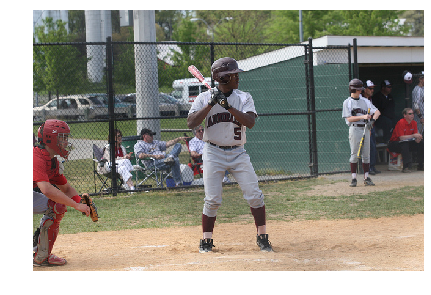

In [ ]:
# look at validation prediction example
def apply_model_to_image_raw_bytes(raw):
    img = utils.decode_image_from_buf(raw)
    fig = plt.figure(figsize=(7, 7))
    plt.grid('off')
    plt.axis('off')
    plt.imshow(img)
    img = utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), final_model.preprocess_for_model)
    print(' '.join(generate_caption(img)[1:-1]))
    plt.show()

def show_valid_example(val_img_fns, example_idx=0):
    zf = zipfile.ZipFile("val2014_sample.zip")
    all_files = set(val_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    apply_model_to_image_raw_bytes(zf.read(example))
    
show_valid_example(val_img_fns, example_idx=100)

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man holding a cell phone in his hand


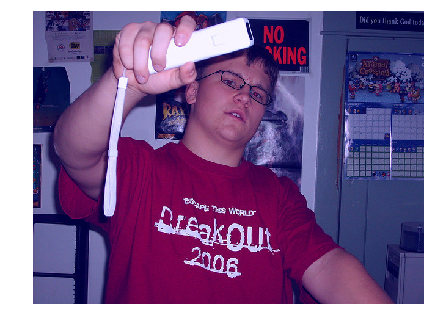

a herd of sheep standing on top of a lush green field


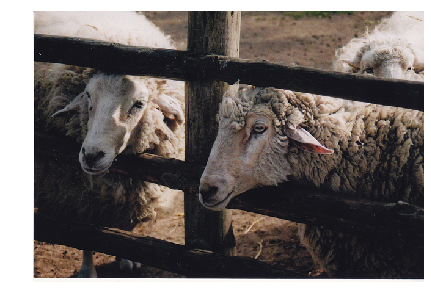

a street sign with a sign and a street sign


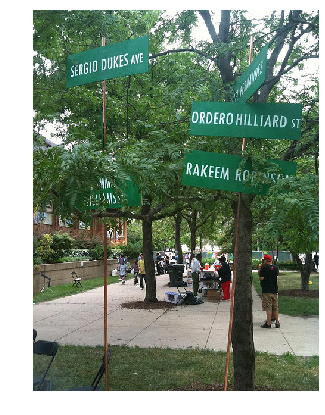

a bowl of fruit and fruit on a table


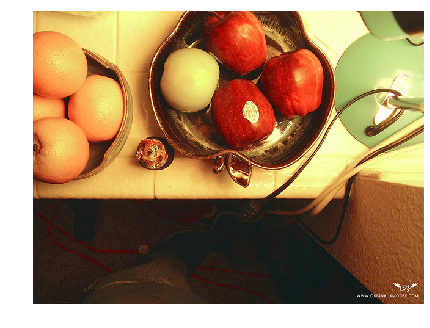

a man standing next to a man holding a frisbee


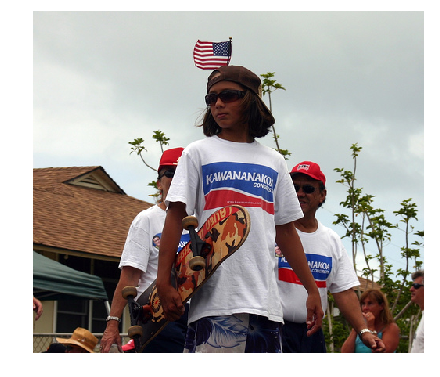

a kitchen with a refrigerator and a refrigerator


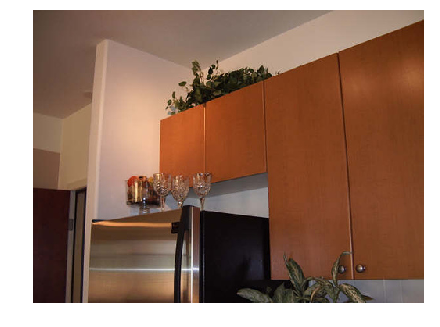

a double decker bus driving down a street


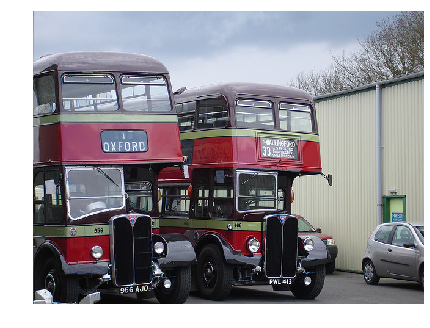

a cat laying on a bed in a room


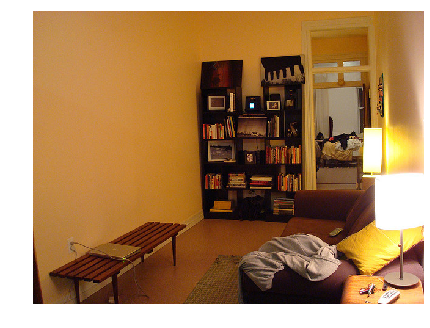

a bicycle parked on a sidewalk next to a building


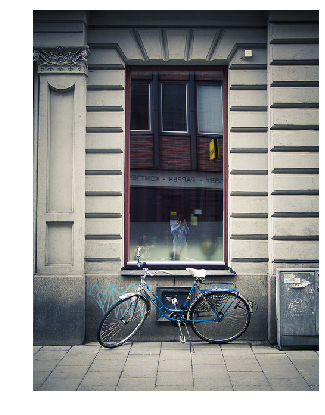

a tennis player is hitting the ball with a racket


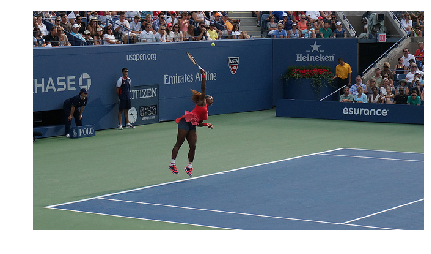

In [ ]:
# sample more images from validation
for idx in np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 10):
    show_valid_example(val_img_fns, example_idx=idx)
    time.sleep(1)

You can download any image from the Internet and appply your model to it!

In [ ]:
# download_utils.download_file(    "http://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg",     "portal-cake-10.jpg"
#)

In [ ]:
# apply_model_to_image_raw_bytes(open("portal-cake-10.jpg", "rb").read())

Now it's time to find 10 examples where your model works good and 10 examples where it fails! 

You can use images from validation set as follows:
```python
show_valid_example(val_img_fns, example_idx=...)
```

You can use images from the Internet as follows:
```python
! wget ...
apply_model_to_image_raw_bytes(open("...", "rb").read())
```

If you use these functions, the output will be embedded into your notebook and will be visible during peer review!

When you're done, download your noteboook using "File" -> "Download as" -> "Notebook" and prepare that file for peer review!

**************************************************
make-wish-10.jpg
a woman holding a plate of food with a knife


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


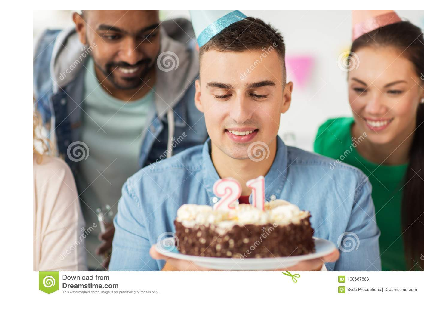

**************************************************
brasil-russia-volei.jpg
a man in a white shirt is playing frisbee


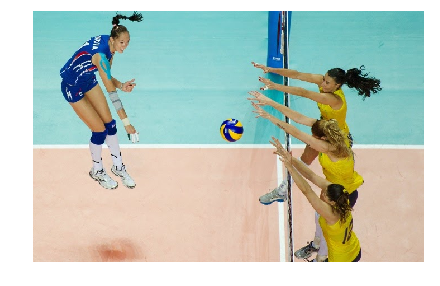

**************************************************
car-river-10.jpg
a small truck parked on the beach next to a body of water


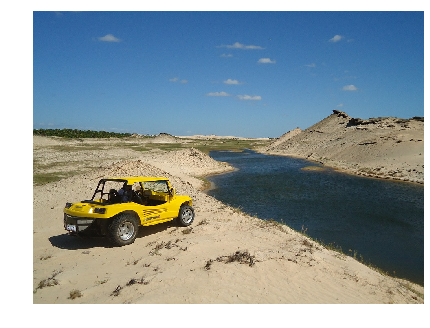

In [ ]:
### YOUR EXAMPLES HERE ###
download_utils.download_file(
    "https://thumbs.dreamstime.com/z/man-birthday-cake-team-office-party-corporate-celebration-people-concept-close-up-happy-men-making-wish-100667883.jpg",
    # "http://3.bp.blogspot.com/-WCmykmSpQR0/U9-UIr2yfrI/AAAAAAAAACY/8CO29TkYLNA/s1600/brasil-russia-volei-700.jpg",
    # "https://cdn.pixabay.com/photo/2014/09/03/20/55/car-434999_960_720.jpg", 
    "make-wish-10.jpg"
)
apply_model_to_image_raw_bytes(open("make-wish-10.jpg", "rb").read())

download_utils.download_file(
    "http://3.bp.blogspot.com/-WCmykmSpQR0/U9-UIr2yfrI/AAAAAAAAACY/8CO29TkYLNA/s1600/brasil-russia-volei-700.jpg",
    "brasil-russia-volei.jpg"
)
apply_model_to_image_raw_bytes(open("brasil-russia-volei.jpg", "rb").read())

download_utils.download_file(
    "https://cdn.pixabay.com/photo/2014/09/03/20/55/car-434999_960_720.jpg", 
    "car-river-10.jpg"
)
apply_model_to_image_raw_bytes(open("car-river-10.jpg", "rb").read())

**************************************************
elephant.jpg


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a large elephant standing next to a tree


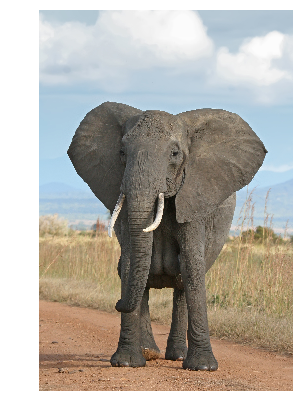

**************************************************
beach.jpg
a beach with a beach and chairs and umbrellas


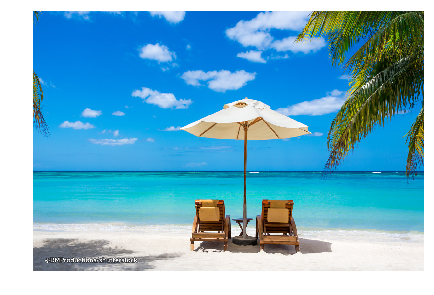

**************************************************
beach2.jpg
a beach with a beach and a beach with a beach background


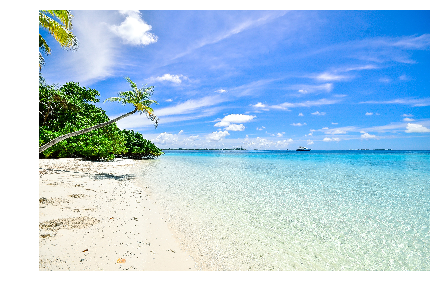

**************************************************
train.jpg
a train is coming down the tracks near a building


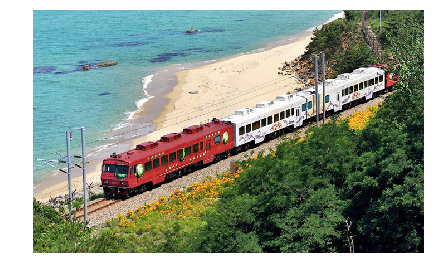

In [ ]:
download_utils.download_file(
    "https://upload.wikimedia.org/wikipedia/commons/3/37/African_Bush_Elephant.jpg",
    "elephant.jpg"
)
apply_model_to_image_raw_bytes(open("elephant.jpg", "rb").read())

download_utils.download_file(
    "http://static.asiawebdirect.com/m/phuket/portals/phuket-com/homepage/yourguide/romantic/beaches/pagePropertiesImage/phuket-romantic-beaches.jpg",
    "beach.jpg"
)
apply_model_to_image_raw_bytes(open("beach.jpg", "rb").read())

download_utils.download_file(
    "https://upload.wikimedia.org/wikipedia/commons/b/b1/Andaman_Beach_-_A_Funstay_day.jpg",
    "beach2.jpg"
)
apply_model_to_image_raw_bytes(open("beach2.jpg", "rb").read())

download_utils.download_file(
    "http://tong.visitkorea.or.kr/cms/resource_etc/62/2503262_image_1.jpg",
    "train.jpg"
)
apply_model_to_image_raw_bytes(open("train.jpg", "rb").read())

**************************************************
sunset.jpg
a beach with a mountain and a mountain range


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


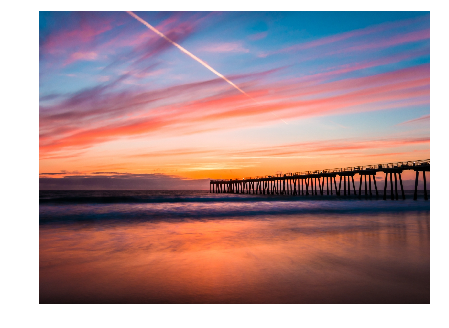

**************************************************
hamburguer.jpg
a sandwich with a sandwich and a salad on it


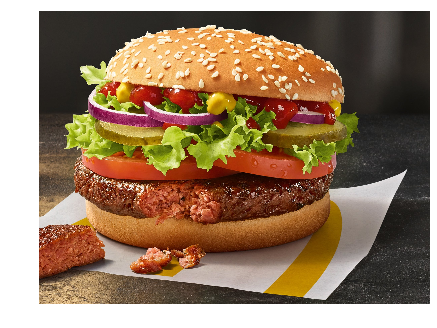

**************************************************
fruit.jpg
a bowl of soup and vegetables on a table


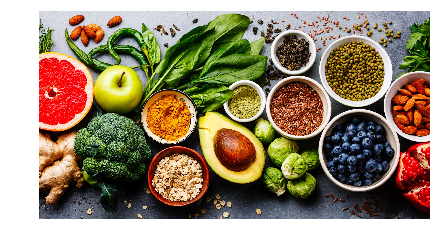

In [ ]:
download_utils.download_file(
    "https://www.discoverlosangeles.com/sites/default/files/styles/hero/public/images/2019-01/Hermosa%20Beach%20Pier%20sunset.jpg",
    "sunset.jpg"
)
apply_model_to_image_raw_bytes(open("sunset.jpg", "rb").read())

download_utils.download_file(
    "https://static.independent.co.uk/s3fs-public/thumbnails/image/2019/04/26/09/mcdonalds-bigvegants.jpg",
    "hamburguer.jpg"
)
apply_model_to_image_raw_bytes(open("hamburguer.jpg", "rb").read())

download_utils.download_file(
    "https://smppharmacy.com/wp-content/uploads/2019/02/food-post.jpg",
    "fruit.jpg"
)
apply_model_to_image_raw_bytes(open("fruit.jpg", "rb").read())

**************************************************
chicken.jpg
a person holding a hot dog in a bowl


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


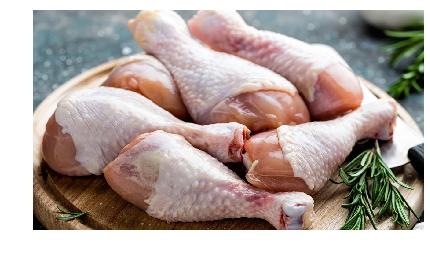

**************************************************
steak.jpg
a plate of food with broccoli and a fork


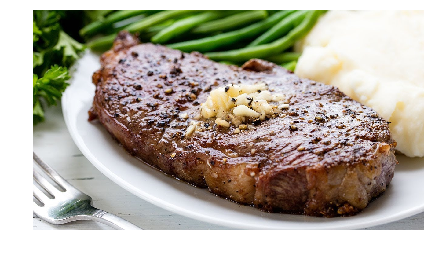

**************************************************
trip.jpg
a man is on a beach with a frisbee


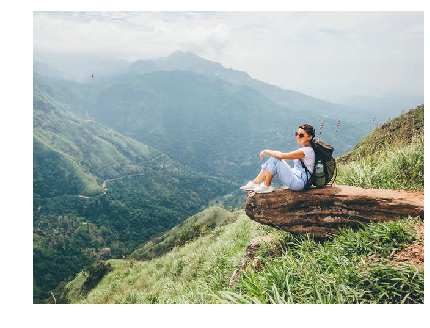

In [ ]:
download_utils.download_file(
    "https://i.ytimg.com/vi/Hq2pavmew58/maxresdefault.jpg",
    "chicken.jpg"
)
apply_model_to_image_raw_bytes(open("chicken.jpg", "rb").read())

download_utils.download_file(
    "https://i.ytimg.com/vi/nsw0Px-Pho8/maxresdefault.jpg",
    "steak.jpg"
)
apply_model_to_image_raw_bytes(open("steak.jpg", "rb").read())

download_utils.download_file(
    "https://img.etimg.com/thumb/height-480,width-640,msid-68286121,imgsize-344713/solo-trip.jpg",
    "trip.jpg"
)
apply_model_to_image_raw_bytes(open("trip.jpg", "rb").read())

**************************************************
trip2.jpg


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


a man riding a motorcycle down a road


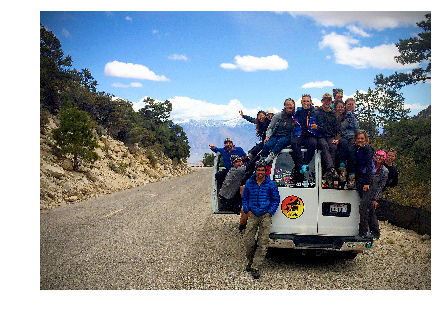

**************************************************
market.jpg
a market with a large pile of oranges and bananas


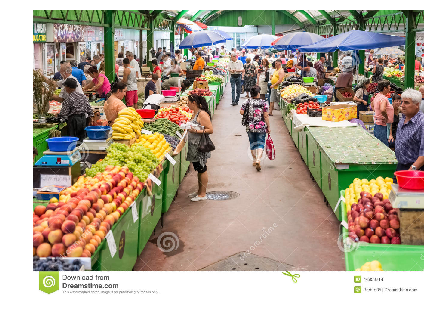

In [ ]:
download_utils.download_file(
    "http://recreation.sa.ucsb.edu/images/default-source/Adv-Prog/trips/ap-truck-2.jpg",
    "trip2.jpg"
)
apply_model_to_image_raw_bytes(open("trip2.jpg", "rb").read())

download_utils.download_file(
    "https://thumbs.dreamstime.com/z/people-shopping-market-bucharest-romania-august-healthy-food-fruits-vegetables-44853214.jpg",
    "market.jpg"
)
apply_model_to_image_raw_bytes(open("market.jpg", "rb").read())

**************************************************
lucas1.jpg
a close up of a piece of cake with a knife


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


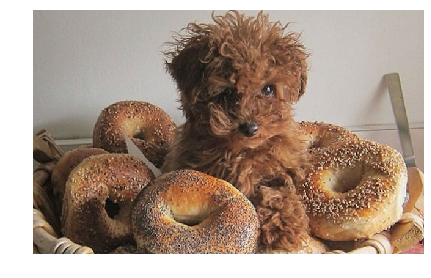

**************************************************
lucas2.jpg
a close up of a person holding a doughnut


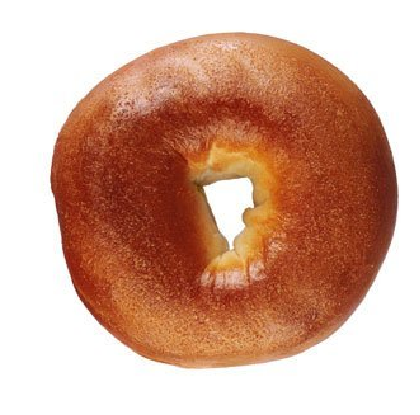

**************************************************
lucas3.jpg
a close up of a bed with a pair of scissors


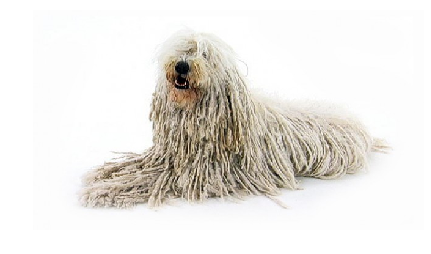

In [ ]:
# download_utils.download_file("https://barkpost.com/wp-content/uploads/2015/11/bagel-dog1.jpg", "lucas1.jpg")
download_utils.download_file("https://i.ibb.co/PFLssNd/bagel-dog1-1.jpg", "lucas1.jpg")
apply_model_to_image_raw_bytes(open("lucas1.jpg", "rb").read())

download_utils.download_file("https://i.ibb.co/dp2LDM6/Can-I-give-my-dog-a-bagel.jpg", "lucas2.jpg")
apply_model_to_image_raw_bytes(open("lucas2.jpg", "rb").read())

download_utils.download_file("https://i.ibb.co/8j7vCNZ/f-komondor-4-LEGGERS.jpg", "lucas3.jpg")
apply_model_to_image_raw_bytes(open("lucas3.jpg", "rb").read())

**************************************************
lucas4.jpg
a baby holding a toothbrush in a bowl


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


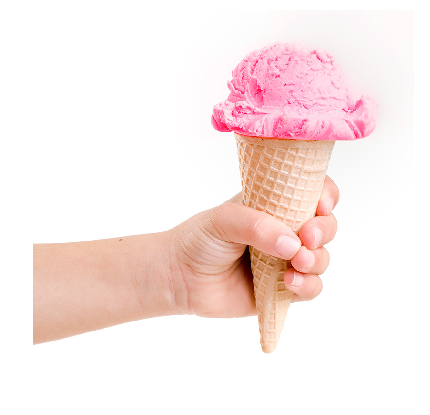

**************************************************
lucas5.jpg
a display of a cake with a knife and a knife


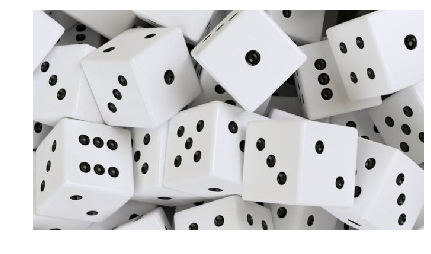

**************************************************
lucas6.jpg
a woman holding a white plate with a cake


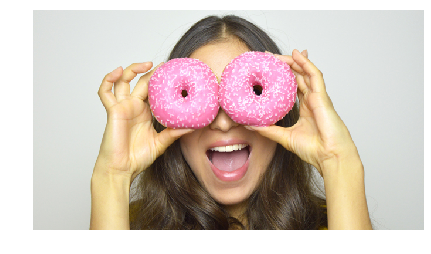

**************************************************
lucas7.jpg
a banana peel and a banana on a wooden table


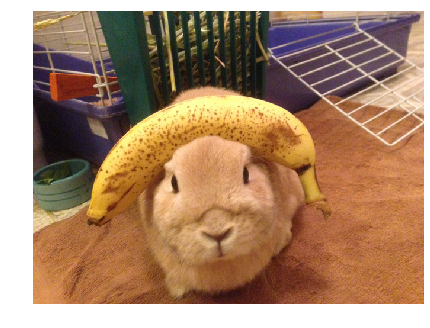

In [ ]:
download_utils.download_file("https://divilover.com/wp-content/uploads/2017/12/icream.jpg", "lucas4.jpg")
apply_model_to_image_raw_bytes(open("lucas4.jpg", "rb").read())

download_utils.download_file("https://ichef.bbci.co.uk/news/660/cpsprodpb/37B5/production/_89716241_thinkstockphotos-523060154.jpg", "lucas5.jpg")
apply_model_to_image_raw_bytes(open("lucas5.jpg", "rb").read())

download_utils.download_file("https://cdn.thedailymash.co.uk/wp-content/uploads/20190324205638/random667.jpg", "lucas6.jpg")
apply_model_to_image_raw_bytes(open("lucas6.jpg", "rb").read())

download_utils.download_file("https://www.sadanduseless.com/wp-content/uploads/2018/01/rabbit2.jpg", "lucas7.jpg")
apply_model_to_image_raw_bytes(open("lucas7.jpg", "rb").read())

**************************************************
art1.jpg
a group of people standing next to a large bird


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


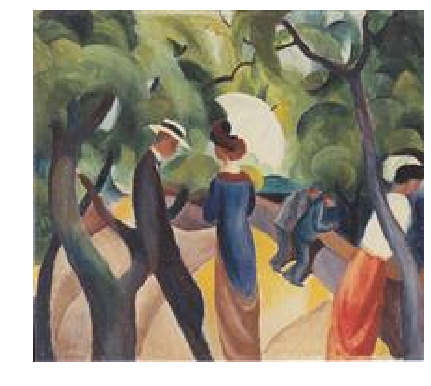

**************************************************
art2.jpg
a man in a wet suit holding a surfboard


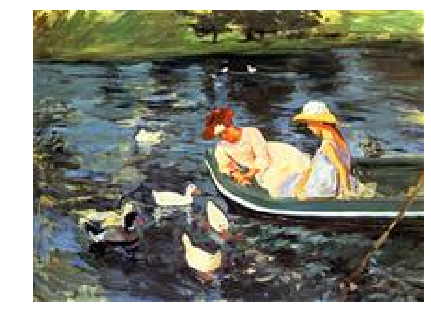

In [ ]:
# Art Work
download_utils.download_file("https://uploads1.wikiart.org/images/august-macke/promenade.jpg!PinterestSmall.jpg", "art1.jpg")
apply_model_to_image_raw_bytes(open("art1.jpg", "rb").read())

download_utils.download_file("https://uploads7.wikiart.org/images/mary-cassatt/summertime-1894.jpg!PinterestSmall.jpg", "art2.jpg")
apply_model_to_image_raw_bytes(open("art2.jpg", "rb").read())

That's it! 

Congratulations, you've trained your image captioning model and now can produce captions for any picture from the  Internet!